In [1]:
using DifferentialEquations
using ModelingToolkit
using LinearAlgebra
using Plots
using Colors
using Images
using Statistics
using Sundials

# Classic Yeast model
### Fast, single polarity
### Spatially homogenous RhoD, all other membrane associated.

In [2]:
# Generate the constants
N = 100
Ax = Array(Tridiagonal([1.0 for i in 1:N-1],[-2.0 for i in 1:N],[1.0 for i in 1:N-1]))
Ay = copy(Ax)
Ax[1,end] = 1.0
Ax[end,1] = 1.0
Ay[1,end] = 1.0
Ay[end,1] = 1.0
Ax = Ax*100 # because scale of domain 
Ay = Ay*100

r0 = zeros(100,100,2)
r0[:,:,1] .= 0.2.*(rand.() .+1)
r0[:,:,2] .= 0.8.*(rand.() .+1)

# Dummy parameters used only locally in fxn but passed to specify scope, or something..
Ayt = zeros(N,N)
Ayd = zeros(N,N)
tAx = zeros(N,N)
dAx = zeros(N,N)
Dt = zeros(N,N)
Dd = zeros(N,N)
R1 = zeros(N,N)

100×100 Matrix{Float64}:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 ⋮                        ⋮              ⋱            ⋮                   
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   

In [3]:
function yeast_fast!(dr,r,p,t)
  Ka, Ki, D1, Ayt,tAx,Dt, R1 = p
  rhoT = @view r[:,:,1]
  rhoD = @view r[:,:,2]
  rhoD .= mean(rhoD)
  dgtp = @view dr[:,:,1]
  dgdp = @view dr[:,:,2]
  mul!(Ayt,Ay,rhoT)
  mul!(tAx,rhoT,Ax)
  @. Dt = D1*(Ayt + tAx)
  @. R1 = Ka*(rhoT/(1+rhoT))*rhoT*rhoD - Ki*rhoT
  #  @. R1 = Ka*rhoT^2*rhoD - Ki*rhoT
  # Alternative nonlinear pos feedback
  @. dgtp = Dt + R1
  @. dgdp = - R1
  end

yeast_fast! (generic function with 1 method)

In [4]:
p = (50,1.0,0.005,Ayt,tAx,Dt,R1)
# p = (10,0.1,0.005,Ayt,tAx,Dt,R1)
# params for alt pos fb equation
yf = ODEProblem(yeast_fast!,r0,(0.0,600),p)
sol_yf = solve(yf,CVODE_BDF(linear_solver=:GMRES),saveat=1)

retcode: Success
Interpolation: 1st order linear
t: 601-element Vector{Float64}:
   0.0
   1.0
   2.0
   3.0
   4.0
   5.0
   6.0
   7.0
   8.0
   9.0
   ⋮
 592.0
 593.0
 594.0
 595.0
 596.0
 597.0
 598.0
 599.0
 600.0
u: 601-element Vector{Array{Float64, 3}}:
 [0.2291140216217122 0.3503139480293436 … 0.38454514808626133 0.25217080811078224; 0.3590502618973201 0.3378431079272268 … 0.3308681963032886 0.24561238174642508; … ; 0.22421709904607928 0.39329739684955156 … 0.3239167491150939 0.36943945793831445; 0.358649182096999 0.27147252578956904 … 0.36001398348345537 0.33054438830571037;;; 1.224303397718227 1.3073079873497306 … 0.8991823517779898 0.8621017052291713; 0.9051987544475342 1.1187085305229711 … 1.1399727174555967 0.9112995705238289; … ; 1.1823971439961365 1.1297099966999147 … 1.2175315574550591 0.9879269230951796; 0.8983102993567371 1.5451648102470248 … 0.8569664652664337 0.9799838614061536]
 [1.384528045214894 1.619159532159471 … 1.779779181996371 1.3987896813701501; 1.39751932

In [ ]:
# p = (50,5.0,0.005,Ayt,tAx,Dt,R1)
# Increasing off rate results in smaller and more concentrated patch.

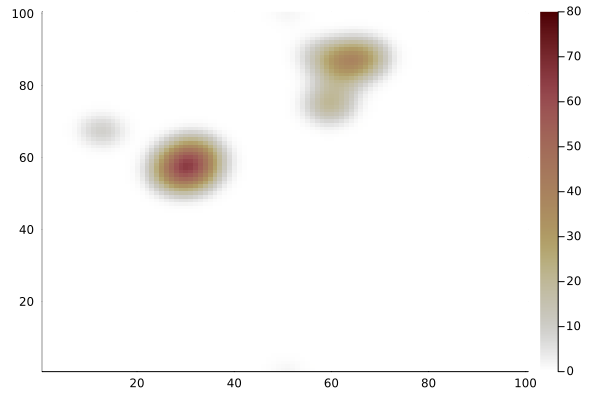

In [42]:
Plots.heatmap(sol_yf[:,:,1,40],clim=(0,80),c=cgrad(:bilbao, rev=true))

┌ Info: Saved animation to /home/dinosaur/Downloads/tmp_yeast_fast.gif
└ @ Plots /home/dinosaur/.julia/packages/Plots/HyyIK/src/animation.jl:156


Plots.AnimatedGif("/home/dinosaur/Downloads/tmp_yeast_fast.gif")
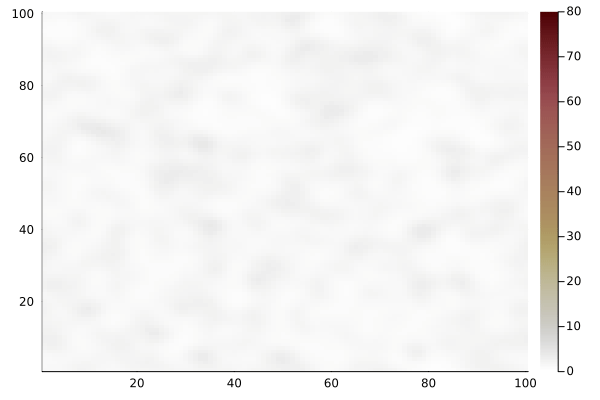

In [43]:
anim = @animate for i in 1:100
    Plots.heatmap(sol_yf[:,:,1,i*6],clim=(0,80),c=cgrad(:bilbao, rev=true))
end
gif(anim, "tmp_yeast_fast.gif", fps=60)
#gif(anim, "yeast_fast_alt.gif", fps=60)

# Yeast model with saturation
### Multiple poles possible
### Spatially homogenous RhoD, all other membrane associated.

In [25]:
function yeast_saturating!(dr,r,p,t)
  Ka, Ki, D1, Ayt,tAx,Dt, R1 = p
  rhoT = @view r[:,:,1]
  rhoD = @view r[:,:,2]
  rhoD .= mean(rhoD)
  dgtp = @view dr[:,:,1]
  dgdp = @view dr[:,:,2]
  mul!(Ayt,Ay,rhoT)
  mul!(tAx,rhoT,Ax)
  @. Dt = D1*(Ayt + tAx)
  @. R1 = Ka*(rhoT^2/(50+rhoT^2))*rhoD - Ki*rhoT
  @. dgtp = Dt + R1
  @. dgdp = - R1
  end

yeast_saturating! (generic function with 1 method)

In [47]:
p = (200,1,0.005,Ayt,tAx,Dt,R1)
ys = ODEProblem(yeast_saturating!,r0,(0.0,600),p)
sol_ys = solve(ys,CVODE_BDF(linear_solver=:GMRES),saveat=1)

retcode: Success
Interpolation: 1st order linear
t: 601-element Vector{Float64}:
   0.0
   1.0
   2.0
   3.0
   4.0
   5.0
   6.0
   7.0
   8.0
   9.0
   ⋮
 592.0
 593.0
 594.0
 595.0
 596.0
 597.0
 598.0
 599.0
 600.0
u: 601-element Vector{Array{Float64, 3}}:
 [0.21220388229648146 0.33793274531504713 … 0.3319619795459041 0.20489969462011015; 0.36625434472882984 0.3916716539359808 … 0.25823691774929225 0.26333173288793443; … ; 0.2501093086308066 0.2489425423923685 … 0.389985971712973 0.2132115136399782; 0.2827313996996816 0.3671425695092647 … 0.21140068909427534 0.3964673150434834;;; 1.2795388731980908 0.9049181337596972 … 0.8149365581842496 0.8394307269412256; 0.9979566070194157 0.9424857439185115 … 0.9742761433157977 1.0497535265885618; … ; 1.5557431760695701 0.9157344061596607 … 0.8712325880706427 1.196907908448823; 0.9112659663414377 1.327525738073379 … 1.3774881794142015 1.3262399905554372]
 [0.5850987987223923 1.1348572924917173 … 0.48780093364119165 0.4700786242591048; 0.8030737

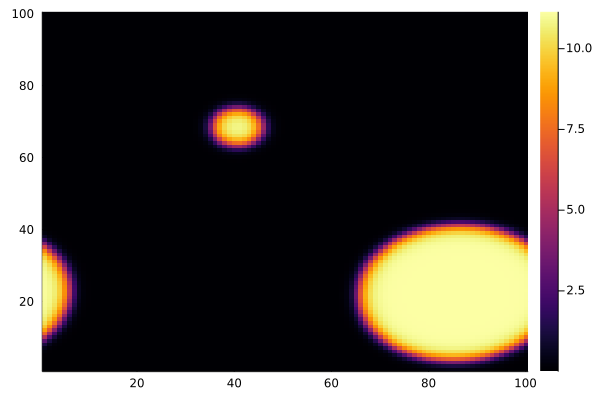

In [48]:
Plots.heatmap(sol_ys[:,:,1,end])

┌ Info: Saved animation to 
│   fn = /tmp/jl_LAHQ1IpS1C.gif
└ @ Plots /home/dinosaur/.julia/packages/Plots/lW9ll/src/animation.jl:137


Plots.AnimatedGif("/tmp/jl_LAHQ1IpS1C.gif")
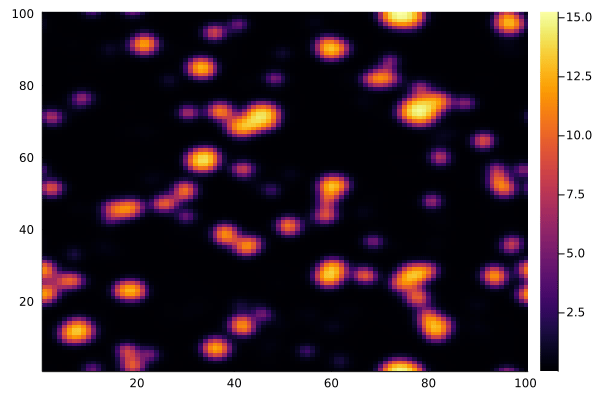

In [49]:
anim = @animate for i in 1:100
    Plots.heatmap(sol_ys[:,:,1,i*6])
end
gif(anim, fps=60)

┌ Info: Saved animation to 
│   fn = /home/dinosaur/Lab/Polarity/julia/yeast_saturating.gif
└ @ Plots /home/dinosaur/.julia/packages/Plots/lW9ll/src/animation.jl:137


Plots.AnimatedGif("/home/dinosaur/Lab/Polarity/julia/yeast_saturating.gif")
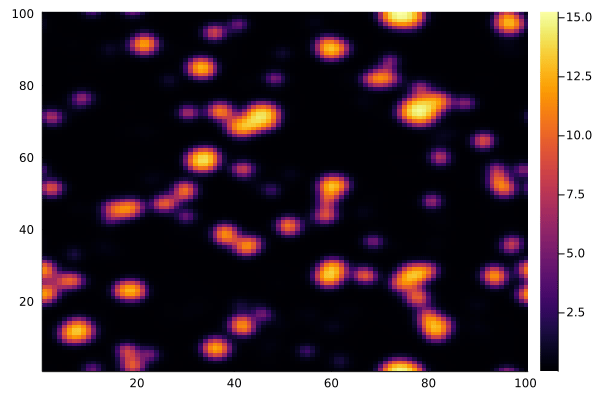

In [50]:
gif(anim, "yeast_saturating.gif", fps=60)

# Yeast model with slowed RhoD (membrane bound)
### Very long convergence
### All species membrane bound

In [218]:
Ayd = zeros(N,N)
dAx = zeros(N,N)
Dd = zeros(N,N)

function yeast_slowed!(dr,r,p,t)
    Ka, Ki, D1, D2, Ayt,tAx,Dt,Ayd,dAx,Dd, R1 = p
    rhoT = @view r[:,:,1]
    rhoD = @view r[:,:,2]
    dgtp = @view dr[:,:,1]
    dgdp = @view dr[:,:,2]
    mul!(Ayt,Ay,rhoT)
    mul!(tAx,rhoT,Ax)
    mul!(Ayd,Ay,rhoD)
    mul!(dAx,rhoD,Ax)
    @. Dt = D1*(Ayt + tAx)
    @. Dd = D2*(Ayd + dAx)
    @. R1 = Ka*rhoT^2*rhoD - Ki*rhoT
    #@. R1 = Ka*(rhoT/(rhoT+1))*rhoT*rhoD - Ki*rhoT
    @. dgtp = Dt + R1
    @. dgdp = Dd - R1
    end

yeast_slowed! (generic function with 1 method)

In [261]:
#p = (50,10,0.005,5,Ayt,tAx,Dt,Ayd,dAx,Dd, R1)
p = (100,3,0.005,5,Ayt,tAx,Dt,Ayd,dAx,Dd, R1)
ysl = ODEProblem(yeast_slowed!,r0,(0.0,600),p)
sol_ysl = solve(ysl,CVODE_BDF(linear_solver=:GMRES),saveat=1)

retcode: Success
Interpolation: 1st order linear
t: 601-element Vector{Float64}:
   0.0
   1.0
   2.0
   3.0
   4.0
   5.0
   6.0
   7.0
   8.0
   9.0
   ⋮
 592.0
 593.0
 594.0
 595.0
 596.0
 597.0
 598.0
 599.0
 600.0
u: 601-element Vector{Array{Float64, 3}}:
 [0.2291140216217122 0.3503139480293436 … 0.38454514808626133 0.25217080811078224; 0.3590502618973201 0.3378431079272268 … 0.3308681963032886 0.24561238174642508; … ; 0.22421709904607928 0.39329739684955156 … 0.3239167491150939 0.36943945793831445; 0.358649182096999 0.27147252578956904 … 0.36001398348345537 0.33054438830571037;;; 1.224303397718227 1.3073079873497306 … 0.8991823517779898 0.8621017052291713; 0.9051987544475342 1.1187085305229711 … 1.1399727174555967 0.9112995705238289; … ; 1.1823971439961365 1.1297099966999147 … 1.2175315574550591 0.9879269230951796; 0.8983102993567371 1.5451648102470248 … 0.8569664652664337 0.9799838614061536]
 [0.7342182411457393 1.0467533584236595 … 4.637195627711944 0.949479515215752; 1.5405462

In [258]:
mean(sol_ysl[:,:,2,end])

0.0006667387561126457

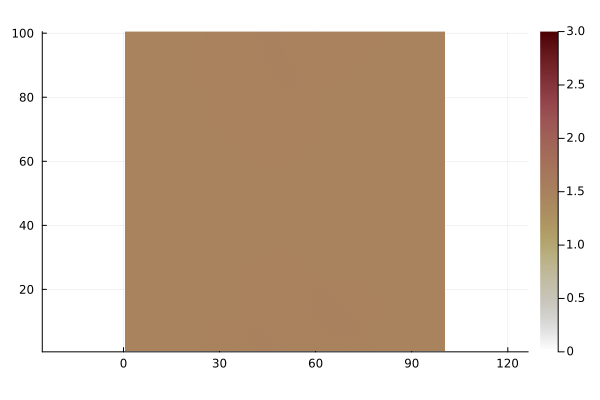

In [260]:
Plots.heatmap(sol_ysl[:,:,1,end],clim=(0,30),c=cgrad(:bilbao, rev=true), aspect_ratio=:equal,color=:transparent)

In [115]:
Plots.heatmap(sol_ysl[:,:,1,1],clim=(0,10),c=cgrad(:bilbao, rev=true),axis=([], false),legend = :none, aspect_ratio=:equal,background_color=:transparent)
savefig("posFBonly_multi_t1.png")
Plots.heatmap(sol_ysl[:,:,1,10],clim=(0,10),c=cgrad(:bilbao, rev=true),axis=([], false),legend = :none, aspect_ratio=:equal,background_color=:transparent)
savefig("posFBonly_multi_t10.png")
Plots.heatmap(sol_ysl[:,:,1,100],clim=(0,10),c=cgrad(:bilbao, rev=true),axis=([], false),legend = :none, aspect_ratio=:equal,background_color=:transparent)
savefig("posFBonly_multi_t100.png")
Plots.heatmap(sol_ysl[:,:,1,600],clim=(0,10),c=cgrad(:bilbao, rev=true),axis=([], false), aspect_ratio=:equal,background_color=:transparent)
savefig("posFBonly_multi_t600.png")

"/home/dinosaur/Downloads/posFBonly_multi_t600.png"

In [ ]:
anim = @animate for i in 1:100
    Plots.heatmap(sol_ysl[:,:,1,i*6])
end
gif(anim, fps=60)

┌ Info: Saved animation to 
│   fn = /home/dinosaur/Lab/Polarity/julia/yeast_no_cyt.gif
└ @ Plots /home/dinosaur/.julia/packages/Plots/lW9ll/src/animation.jl:137


Plots.AnimatedGif("/home/dinosaur/Lab/Polarity/julia/yeast_no_cyt.gif")
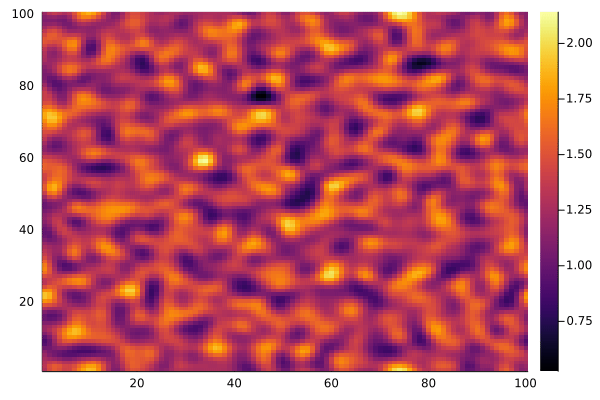

In [95]:
gif(anim, "yeast_no_cyt.gif", fps=60)

# Yeast model with saturation and slowed RhoD

In [96]:
function yeast_slowed_saturated!(dr,r,p,t)
    Ka, Ki, D1, D2, Ayt,tAx,Dt,Ayd,dAx,Dd, R1 = p
    rhoT = @view r[:,:,1]
    rhoD = @view r[:,:,2]
    dgtp = @view dr[:,:,1]
    dgdp = @view dr[:,:,2]
    mul!(Ayt,Ay,rhoT)
    mul!(tAx,rhoT,Ax)
    mul!(Ayd,Ay,rhoD)
    mul!(dAx,rhoD,Ax)
    @. Dt = D1*(Ayt + tAx)
    @. Dd = D2*(Ayd + dAx)
    @. R1 = Ka*(rhoT^2/(50+rhoT^2))*rhoD - Ki*rhoT
    @. dgtp = Dt + R1
    @. dgdp = Dd - R1
    end

yeast_slowed_saturated! (generic function with 1 method)

In [105]:
p = (200,1,0.005, 0.5,Ayt,tAx,Dt,Ayd,dAx,Dd, R1)
yss = ODEProblem(yeast_slowed_saturated!,r0,(0.0,600),p)
sol_yss = solve(yss,CVODE_BDF(linear_solver=:GMRES),saveat=1)

retcode: Success
Interpolation: 1st order linear
t: 601-element Vector{Float64}:
   0.0
   1.0
   2.0
   3.0
   4.0
   5.0
   6.0
   7.0
   8.0
   9.0
   ⋮
 592.0
 593.0
 594.0
 595.0
 596.0
 597.0
 598.0
 599.0
 600.0
u: 601-element Vector{Array{Float64, 3}}:
 [0.21220388229648146 0.33793274531504713 … 0.3319619795459041 0.20489969462011015; 0.36625434472882984 0.3916716539359808 … 0.25823691774929225 0.26333173288793443; … ; 0.2501093086308066 0.2489425423923685 … 0.389985971712973 0.2132115136399782; 0.2827313996996816 0.3671425695092647 … 0.21140068909427534 0.3964673150434834;;; 1.2795388731980908 0.9049181337596972 … 0.8149365581842496 0.8394307269412256; 0.9979566070194157 0.9424857439185115 … 0.9742761433157977 1.0497535265885618; … ; 1.5557431760695701 0.9157344061596607 … 0.8712325880706427 1.196907908448823; 0.9112659663414377 1.327525738073379 … 1.3774881794142015 1.3262399905554372]
 [0.5658648783556949 1.0698383143595118 … 0.47813940201660043 0.4602671351997879; 0.7560363

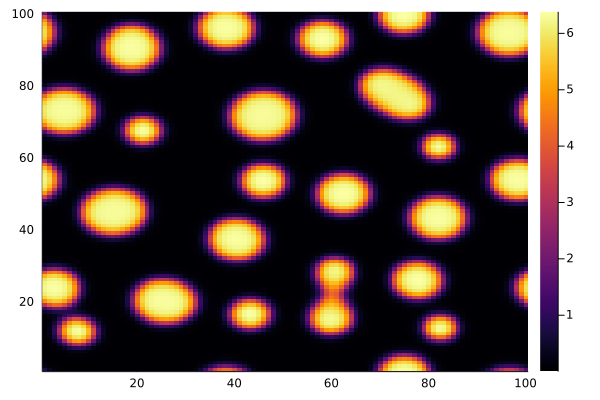

In [108]:
Plots.heatmap(sol_yss[:,:,1,end])

┌ Info: Saved animation to 
│   fn = /tmp/jl_DCB6biDCh0.gif
└ @ Plots /home/dinosaur/.julia/packages/Plots/lW9ll/src/animation.jl:137


Plots.AnimatedGif("/tmp/jl_DCB6biDCh0.gif")
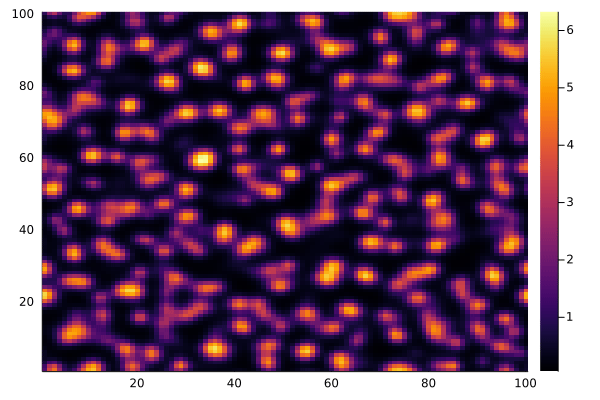

In [102]:
anim = @animate for i in 1:100
    Plots.heatmap(sol_yss[:,:,1,i*6])
end
gif(anim, fps=60)

In [ ]:
gif(anim, "yeast_slowed_n_saturated.gif", fps=60)